<a href="https://colab.research.google.com/github/PedroNhoura/Mapeamento_Usinas_Python/blob/main/Projeto_Hidre.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Mapeamento em Python das usinas hidrelétricas Dados Ambientais CEMIG





Pacotes e Imports

In [2]:
!pip install folium # framework pip isn fol
!pip install geopandas
!pip install descartes


     |████████████████████████████████| 1.0 MB 14.8 MB/s 
     |████████████████████████████████| 16.7 MB 291 kB/s 
     |████████████████████████████████| 6.3 MB 51.4 MB/s 


In [3]:
import folium #importar 
import pandas as pd
from folium import plugins
import geopandas as gpd 


In [4]:
tab_hidre_mg = pd.read_excel('/content/drive/MyDrive/Colab Notebooks/Projetos/Usinas_Hidre/tabela_coord_hidre_mg.xlsx')
tab_hidre_mg.head(10)

,NOME,MUNIC_CF,UF_CF,LAT_EIXO_D,LONG_EIXO1
0,Pedro Affonso Junqueira (Antiga Antas I),Poços de Caldas,MG,-21.767763,-46.607817
1,Barra do Braúna,Recreio,MG,-21.450142,-42.404638
2,Amador Aguiar I (Antiga Capim Branco I),Araguari,MG,-18.789137,-48.148599
3,Picada,Juiz de Fora,MG,-21.884858,-43.540836
4,Monte Alto,Passos,MG,-20.782364,-46.722430
5,João Camilo Penna (Antiga Cachoeira do Emboque),Raul Soares,MG,-20.117556,-42.396767
6,Davinópolis,Abadia dos Dourados,MG,-18.209722,-47.516111
7,Marmelos,Juiz de Fora,MG,-21.787049,-43.310505
8,Neblina,Ipanema,MG,-19.832810,-41.800731
9,Simplício,Além Paraíba,MG,-21.920744,-42.793148


Criação de uma lista com as coord lat e long e plotagem no mapa





In [5]:
#lista de coordenadas e nomes das usinas de minas gerais 
lista_coord = []
list_nomes_usinas = []
#iniciar mapa 
mapa_mg = folium.Map(location=[-19.916667,-43.933333], zoom_start=7)

#exec lag long pou up 
mapa_mg.add_child(folium.LatLngPopup())

#execut for p ler a tabela de excel e agrupar as coordenadas
for lat, lng in zip(tab_hidre_mg.LAT_EIXO_D, tab_hidre_mg.LONG_EIXO1):
  lista_coord.append([lat,lng])


#roda a lista de nomes das usinas

for nome in tab_hidre_mg['NOME']:
  list_nomes_usinas.append(nome)
   
#print(list_nomes_usinas)
#execut for para usar o index  cada coordenada do mapa e executar o marcador (Marker)
for index in range(0, len(lista_coord)):
  coord = lista_coord[index]
  nome_usina = list_nomes_usinas[index]

  folium.Marker(coord, tooltip = nome_usina ).add_to(mapa_mg)
  folium.CircleMarker(location=coord, radium=50, color='#3186cc',fill=True, fill_color='#3186cc',).add_to(mapa_mg)

mapa_mg
  


In [6]:
#heatmap das usinas mg
mapa_mg = folium.Map(location=[-19.916667,-43.933333], tiles = 'OpenStreetMap' , zoom_start=4 )
mapa_mg.add_child(plugins.HeatMap(lista_coord))
mapa_mg.add_child(folium.LatLngPopup())


In [7]:
path = '/content/drive/MyDrive/Colab Notebooks/Testes/Limites_municipais.shp'
df = gpd.read_file(path)
df.head(10)

,ID,CD_GEOCODM,NM_MUNICIP,geometry
0,697,3107802,BOM JESUS DO GALHO,"POLYGON ((-42.36279 -19.77028, -42.36289 -19.7..."
1,698,3107901,BOM REPOUSO,"POLYGON ((-46.25471 -22.44455, -46.25465 -22.4..."
2,699,3108008,BOM SUCESSO,"POLYGON ((-44.71692 -20.86518, -44.71688 -20.8..."
3,700,3108107,BONFIM,"POLYGON ((-44.18704 -20.23388, -44.18697 -20.2..."
4,701,3108206,BONFINÓPOLIS DE MINAS,"POLYGON ((-46.51077 -16.31195, -46.51061 -16.3..."
5,702,3108255,BONITO DE MINAS,"POLYGON ((-44.86919 -14.59338, -44.86971 -14.5..."
6,703,3108305,BORDA DA MATA,"POLYGON ((-46.18645 -22.17682, -46.18639 -22.1..."
7,704,3108404,BOTELHOS,"POLYGON ((-46.52313 -21.61419, -46.52290 -21.6..."
8,705,3108503,BOTUMIRIM,"POLYGON ((-43.09157 -16.70485, -43.09107 -16.7..."
9,706,3108552,BRASILÂNDIA DE MINAS,"POLYGON ((-46.06144 -16.71683, -46.06114 -16.7..."


In [8]:
#Convert CRS SIRGAS2000 to WGS84 = 4326
df.crs
df = df.to_crs(epsg=4326)
print(df.crs)
df.head()

epsg:4326


,ID,CD_GEOCODM,NM_MUNICIP,geometry
0,697,3107802,BOM JESUS DO GALHO,"POLYGON ((-42.36279 -19.77028, -42.36289 -19.7..."
1,698,3107901,BOM REPOUSO,"POLYGON ((-46.25471 -22.44455, -46.25465 -22.4..."
2,699,3108008,BOM SUCESSO,"POLYGON ((-44.71692 -20.86518, -44.71688 -20.8..."
3,700,3108107,BONFIM,"POLYGON ((-44.18704 -20.23388, -44.18697 -20.2..."
4,701,3108206,BONFINÓPOLIS DE MINAS,"POLYGON ((-46.51077 -16.31195, -46.51061 -16.3..."


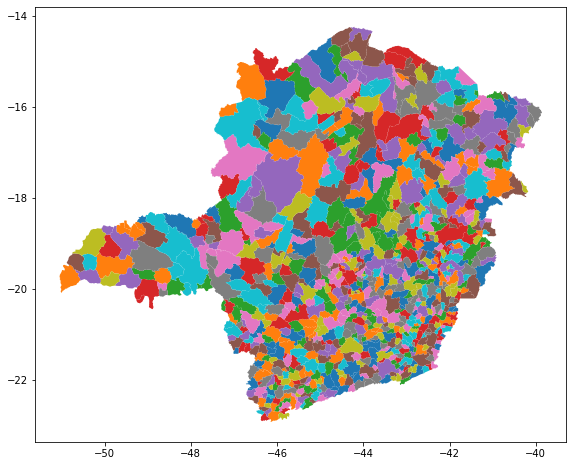

In [13]:
shapefile = gpd.read_file('/content/drive/MyDrive/Colab Notebooks/Testes/Limites_municipais.shp')
#shapefile.head(10)
shapefile.plot(column='NM_MUNICIP', figsize=(16,8))

In [11]:
mapa_poli = folium.Map(location=[-20.5314, -41.4598], zoom_start=6, tiles='CartoDB positron')


for _, r in df.iterrows():
    # Without simplifying the representation of each borough,
    # the map might not be displayed
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'green'})
    folium.Popup(r['NM_MUNICIP']).add_to(geo_j)
    geo_j.add_to(mapa_poli)
    mapa_poli.add_child(folium.LatLngPopup())
    

   
mapa_poli
